In [1]:
# import essential libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
# load the dataset
data = pd.read_csv('data/ResaleflatpricesbasedonregistrationdatefromJan2017onwards.csv')

# check the dimension of the dataset
numrow, numcol = data.shape
print('The dataset contains {} rows and {} columns.'.format(numrow, numcol))

# check the attributes in the dataset
attributes = data.columns
print('Attributes in the dataset:', attributes)

# display the first 5 rows of the dataset
display(data.head(n=5))

The dataset contains 183650 rows and 11 columns.
Attributes in the dataset: Index(['month', 'town', 'flat_type', 'block', 'street_name', 'storey_range',
       'floor_area_sqm', 'flat_model', 'lease_commence_date',
       'remaining_lease', 'resale_price'],
      dtype='object')


,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
0,2017-01,ANG MO KIO,2 ROOM,406,ANG MO KIO AVE 10,10 TO 12,44.0,Improved,1979,61 years 04 months,232000.0
1,2017-01,ANG MO KIO,3 ROOM,108,ANG MO KIO AVE 4,01 TO 03,67.0,New Generation,1978,60 years 07 months,250000.0
2,2017-01,ANG MO KIO,3 ROOM,602,ANG MO KIO AVE 5,01 TO 03,67.0,New Generation,1980,62 years 05 months,262000.0
3,2017-01,ANG MO KIO,3 ROOM,465,ANG MO KIO AVE 10,04 TO 06,68.0,New Generation,1980,62 years 01 month,265000.0
4,2017-01,ANG MO KIO,3 ROOM,601,ANG MO KIO AVE 5,01 TO 03,67.0,New Generation,1980,62 years 05 months,265000.0


In [3]:
# summary of dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 183650 entries, 0 to 183649
Data columns (total 11 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   month                183650 non-null  object 
 1   town                 183650 non-null  object 
 2   flat_type            183650 non-null  object 
 3   block                183650 non-null  object 
 4   street_name          183650 non-null  object 
 5   storey_range         183650 non-null  object 
 6   floor_area_sqm       183650 non-null  float64
 7   flat_model           183650 non-null  object 
 8   lease_commence_date  183650 non-null  int64  
 9   remaining_lease      183650 non-null  object 
 10  resale_price         183650 non-null  float64
dtypes: float64(2), int64(1), object(8)
memory usage: 15.4+ MB


In [4]:
# check duplicates record and missing value in each attributes
print('Number of duplicate records in the dataset:', data.duplicated().sum())
print('Number of missing value in each attributes:')
print(data.isna().sum())

Number of duplicate records in the dataset: 288
Number of missing value in each attributes:
month                  0
town                   0
flat_type              0
block                  0
street_name            0
storey_range           0
floor_area_sqm         0
flat_model             0
lease_commence_date    0
remaining_lease        0
resale_price           0
dtype: int64


In [5]:
# convert column 'month' into datetime format
data['month'] = pd.to_datetime(data['month'])

# extract the 'year' and 'month' and create new columns
data['year'] = data['month'].dt.year
data['Month'] = data['month'].dt.month

# drop the original 'month' column
data.drop(columns=['month'], axis=1, inplace=True)

In [6]:
# create a new column 'price_per_sqm'
data['price_per_sqm'] = round(data['resale_price'] / data['floor_area_sqm'], 2)

# drop columns 'floor_area_sqm' & 'resale_price'
data.drop(columns=['floor_area_sqm','resale_price'], axis=1, inplace=True)

In [7]:
# calculate and convert the remaining lease into number of month format
def calculate_remaining_lease_month(lease):
    try:
        years = int(lease.split(' ')[0])*12 
        months = int(lease.split(' ')[2])
        return years + months
    except:
        return years

data['remaining_lease_month'] = data['remaining_lease'].apply(lambda x: calculate_remaining_lease_month(x))

# remove the column 'remaining_lease'
data.drop(columns=['remaining_lease'], axis=1, inplace=True)

In [8]:
# import hdb location dataset
hdb_locations = pd.read_csv('data/sg_zipcode_mapper_utf.csv', index_col=[0])
hdb_locations.head()

,postal,lat,lng,searchval,block,street_name,building,address,postal.1
0,398614,1.312763,103.883519,# 1 LOFT,1,LORONG 24 GEYLANG,# 1 LOFT,1 LORONG 24 GEYLANG # 1 LOFT SINGAPORE 398614,398614
1,398721,1.312390,103.881504,# 1 SUITES,1,LORONG 20 GEYLANG,# 1 SUITES,1 LORONG 20 GEYLANG # 1 SUITES SINGAPORE 398721,398721
2,629875,1.309135,103.679463,1 BENOI RD SINGAPORE 629875,1,BENOI RD,NIL,1 BENOI RD SINGAPORE 629875,629875
3,439731,1.305466,103.895674,1 BOSCOMBE RD SINGAPORE 439731,1,BOSCOMBE RD,NIL,1 BOSCOMBE RD SINGAPORE 439731,439731
4,659592,1.344619,103.749789,1 BUKIT BATOK ST 22 SINGAPORE 659592,1,BUKIT BATOK ST 22,NIL,1 BUKIT BATOK ST 22 SINGAPORE 659592,659592


In [9]:
# create a new dataframe `imputed_dataset` by merging `hdb_locations` & `resale_dataset`
imputed_dataset = pd.merge(hdb_locations, data, left_on=['block','street_name'], right_on=['block','street_name'], how='right')

In [10]:
# import mrt dataset
mrt_location = pd.read_csv('data/mrt_data.csv')
mrt_location.drop(columns=['type'], axis=1, inplace=True)

In [11]:
# exclude the instances with missing value
df_copy = imputed_dataset.copy()
df_copy.dropna(inplace=True)

In [12]:
from sklearn.neighbors import KNeighborsClassifier

resale_coords = df_copy[['lat', 'lng']]

# set the number of nearest neighbors to 1 (nearest MRT station)
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(mrt_location[['lat', 'lng']], mrt_location['station_name'])

# predict the nearest MRT station for each resale record
nearest_station = knn.predict(resale_coords)

# add the nearest MRT station to the imputed_dataset
df_copy['nearest_mrt'] = nearest_station

In [13]:
# remove columns not use in analysis
df_copy.drop(columns=['postal', 'searchval', 'postal.1', 'storey_range', 'address'], axis=1, inplace=True)

In [14]:
# merge the mrt_locations with the imputed_datset to get the mrt station coordinate
df_copy = pd.merge(df_copy, mrt_location, left_on=['nearest_mrt'], right_on=['station_name'], how='left')

In [15]:
# function to calculate distance from MRT station
from math import sin, cos, sqrt, atan2, radians

def earth_distance(x, y):

  # Approximate radius of earth in km
  R = 6373.0

  lat1, lng1 = radians(x[0]), radians(x[1])
  lat2, lng2 = radians(y[0]), radians(y[1])

  dlon = lng2 - lng1
  dlat = lat2 - lat1

  a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
  c = 2 * atan2(sqrt(a), sqrt(1 - a))

  return R * c

# calculate distance for each row
def calculate_distance(row):
    return earth_distance((row['lat_x'], row['lng_x']), (row['lat_y'], row['lng_y']))

df_copy['mrt_dist'] = df_copy.apply(calculate_distance, axis=1)

In [16]:
# export the processed data in csv 
df_copy.head()
df_copy.to_csv('data/cleaned_data.csv', index=False)

In [17]:
# distribution of resale HDB by year
hdb_year = df_copy['year'].value_counts().sort_index()
hdb_year_df = pd.DataFrame(hdb_year).reset_index()
hdb_year_df.columns = ['Year', 'Count']

bar = px.bar(hdb_year_df, x='Year', y='Count', 
             width=800, height=500, 
             template='plotly_dark', 
             title='Distribution of Resale HDB by Year')

bar.update_layout(
    xaxis = dict(
        title = 'Year'
    ),
    yaxis = dict(
        title = 'Count'
    )
)

bar.show()

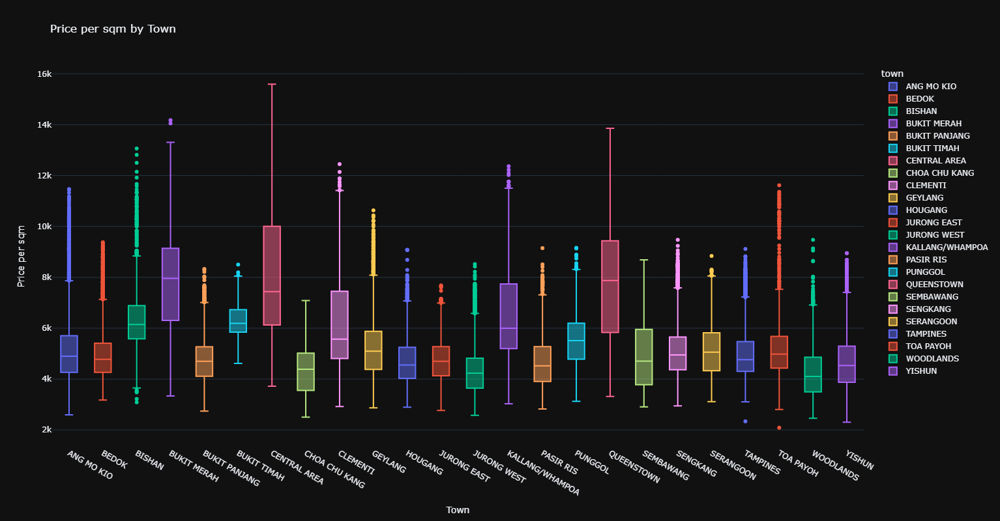

In [18]:
# variation / distribution of the price per sqm in each twon
fig = px.box(df_copy, x='town', y='price_per_sqm', color='town', 
             width=1200, height=800, 
             template='plotly_dark', 
             title='Price per sqm by Town')

fig.update_layout(
    xaxis = dict(
        title = 'Town'
    ),
    yaxis = dict(
        title = 'Price per sqm'
    )
)

fig.show()

In [19]:
# correlation between price_per_sqm and remaining_lease_month
fig = px.scatter(x=df_copy['price_per_sqm'], y=df_copy['remaining_lease_month'], 
                 width=1200, height=1000, 
                 template='plotly_dark', 
                 title='Price per sqm vs Remaining Lease (Months)')

fig.update_layout(
    xaxis = dict(
        title = 'Remaining Lease (Months)'
    ),
    yaxis = dict(
        title = 'Price per sqm'
    )
)

fig.show()

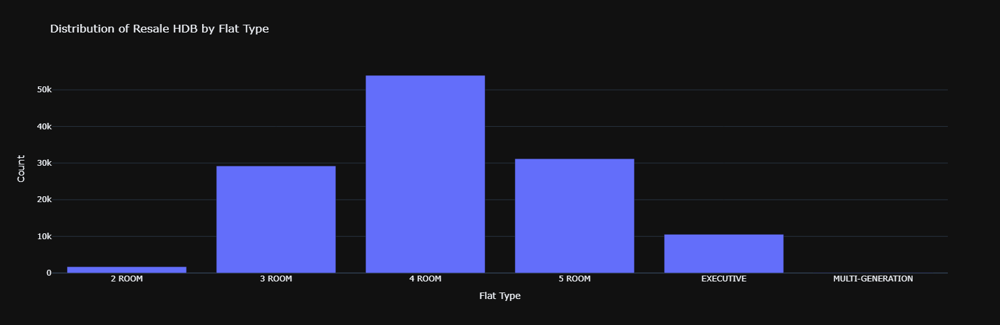

In [20]:
# distribution of resale HDB by flat type
flat_type = df_copy['flat_type'].value_counts().sort_index()
flat_type_df = pd.DataFrame(flat_type).reset_index()
flat_type_df.columns = ['Flat_Type', 'Count']

bar = px.bar(data_frame=flat_type_df, x='Flat_Type', y='Count', width=800, height=500, template='plotly_dark', title='Distribution of Resale HDB by Flat Type')
bar.update_layout(
    xaxis = dict(
        title = 'Flat Type'
    ),
    yaxis = dict(
        title = 'Count'
    )
)
bar.show()

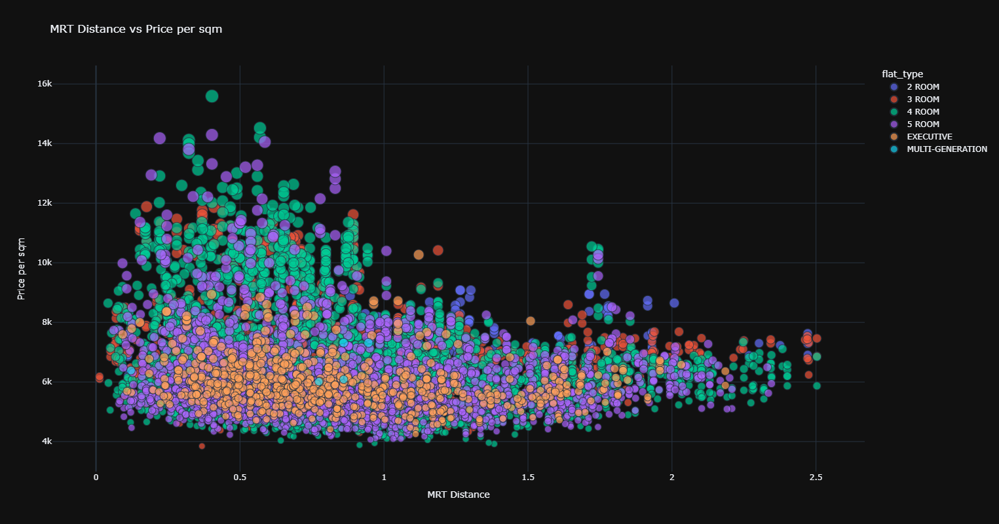

In [21]:
# correlation between MRT distance and price per sqm 
scatter = px.scatter(data_frame=df_copy[df_copy['year']==2024], x='mrt_dist', y='price_per_sqm', size='price_per_sqm', color='flat_type', width=1200, height=800, template='plotly_dark', title='MRT Distance vs Price per sqm')
scatter.update_layout(
    xaxis = dict(
        title = 'MRT Distance'
    ),
    yaxis = dict(
        title = 'Price per sqm'
    )
)
scatter.show()